In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#写真名(jpg)
picture_name='test17'

In [ ]:
from IPython.core.interactiveshell import Integer
#画像の細分化

#ライブラリのインポート
import cv2
import numpy as np

#フォルダを作成する(同名フォルダが存在する場合エラーになるので存在確認してから)
import os
#picture_nameは上で定義済み
print(picture_name)
folder = r"drive/MyDrive/test_photo/data_" + picture_name
if not os.path.exists(folder):
  os.mkdir(folder)
  print("folder is made!")
else:
  print("folder exists!")


drive_root_dir='/content/drive/MyDrive/test_photo'
#画像の読み込み
img=cv2.imread(drive_root_dir+'/'+picture_name+'.jpg',cv2.IMREAD_COLOR)
h,w=img.shape[:2]
print("high is " + str(h));print("width is " + str(w));

#横長画像
if h<w:
  split_x=4
  split_y=3
  print("横長画像")
#縦長画像
else:
  split_x=3
  split_y=4
  print("縦長画像")
#画像の分割処理
cx=0
cy=0
k=0

width=int(w/split_x)#分割画像の横サイズ
high =int(h/split_y)#分割画像の縦サイズ

print("split_x,width,high")
print(split_x,width,high)
for i in range(split_y*2-1):
    for j in range(split_x*2-1):
        split_pic=img[cy:cy+high,cx:cx+width,:]
        cv2.imwrite(drive_root_dir + '/data_' + picture_name + '/' + str(k)+'.jpg',split_pic)
        cx=cx+int(width/2)
        #print(k)#デバッグ用
        k+=1
    cx=0
    cy=cy+int(high/2)

test17
folder is made!
high is 1109
width is 1479
横長画像
split_x,width,high
4 369 369


In [ ]:
#保存待機時間
import time

# sleep 前のエポック秒(UNIX時間)を取得
startSec = time.time()

# 20 秒 止める
time.sleep(20)

2.0.1+cu118
True


Using cache found in /root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub
Using cache found in /root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub


test17
folder is made!


<ipython-input-32-a43ecaf10981>:77: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1)


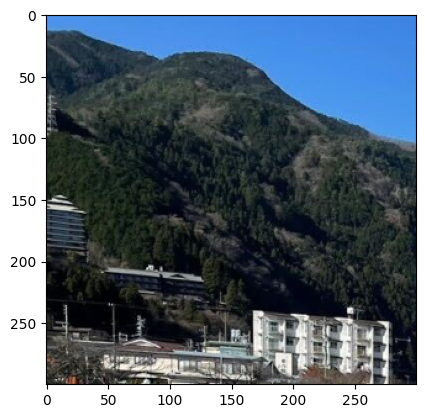

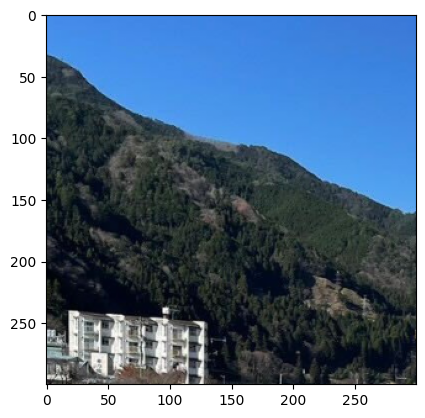

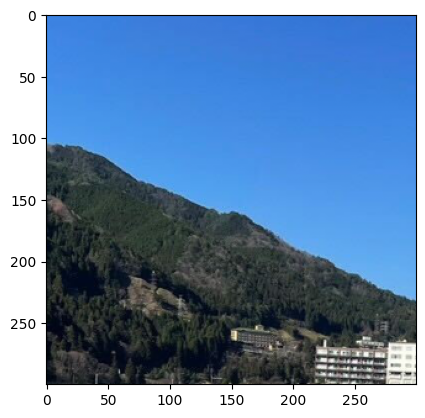

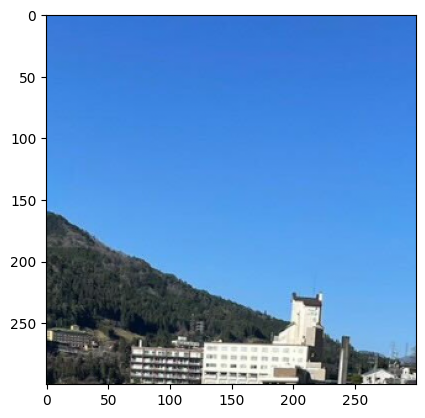

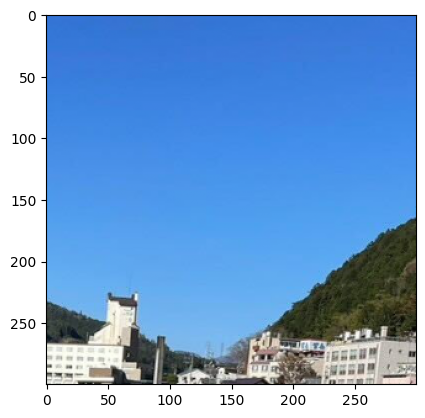

...

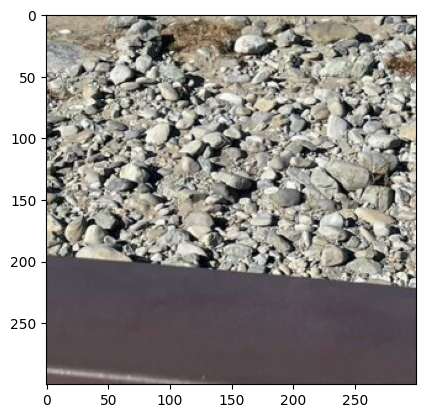

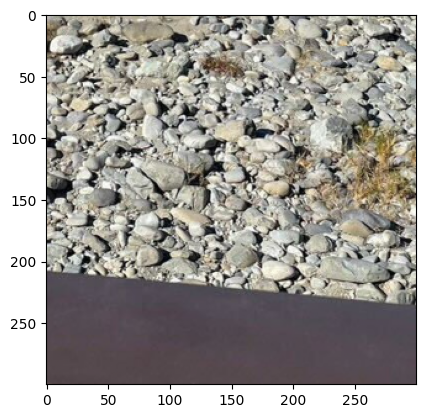

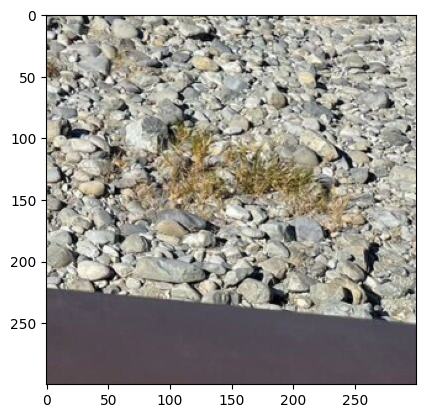

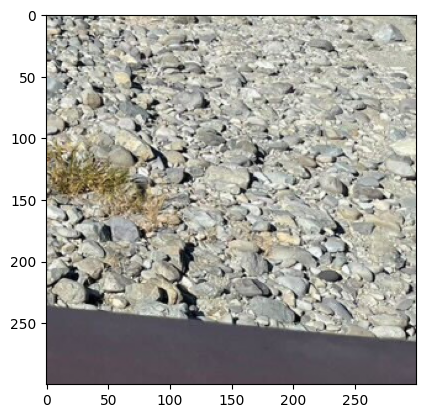

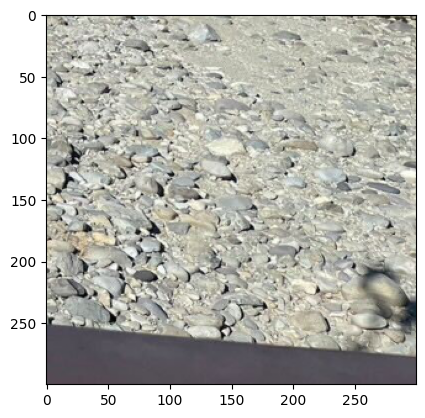

In [ ]:
#ssdによる物体認識パート

import torch
import pathlib
import cv2
import numpy as np

print(torch.__version__)
precision = 'fp32'
device = torch.device('cuda')
print(torch.cuda.is_available())
#torch.hub.list('NVIDIA/DeepLearningExamples:torchhub')
#torch.hub.help('NVIDIA/DeepLearningExamples:torchhub','nvidia_ssd')
ssd_model = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_ssd', model_math=precision)#学習済みモデル
utils = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_ssd_processing_utils')#データの処理機能

# CPUで動くようにして、推論モード
ssd_model.to('cuda')
ssd_model.eval()

#input data

uris = [
  ]

print(picture_name)
#picture_name='castle_people'上で定義済み
imput_path='/content/drive/MyDrive/test_photo/data_' + picture_name +'/'
#imput_path='/content/drive/MyDrive/seminar/picture_data_minimize/data_castle/'
#フォルダを作成する(同名フォルダが存在する場合エラーになるので存在確認してから)
import os

folder = r"drive/MyDrive/test_photo/data_" + picture_name +"/found_person"
if not os.path.exists(folder):
  os.mkdir(folder)
  print("folder is made!")
else:
  print("folder exists!")



for j in range(35):
 uris.append(imput_path + str(j) +".jpg")

#uris.append(imput_path + str(9) +".jpg")

# 入力データ作成
inputs = [utils.prepare_input(uri) for uri in uris]
tensor = utils.prepare_tensor(inputs, precision == 'fp16')
tensor = tensor.to('cuda')

# 検知
with torch.no_grad():
    detections_batch = ssd_model(tensor)

# 検知する種類 犬とか人とか80種類
classes_to_labels = utils.get_coco_object_dictionary()
#print(classes_to_labels)
#print('クラス数', len(classes_to_labels))

# 結果取得
results_per_input = utils.decode_results(detections_batch)
best_results_per_input = [utils.pick_best(results, 0.40) for results in results_per_input]

# 1つ目の結果

bboxes, classes, confidences = best_results_per_input[0]
#print('検知ボックス', bboxes)
#print('検知クラス', classes, classes_to_labels[classes[0]-1])
#print('確信度', confidences)


from matplotlib import pyplot as plt
import matplotlib.patches as patches

for image_idx in range(len(best_results_per_input)):
    fig, ax = plt.subplots(1)
    # Show original, denormalized image...
    image = inputs[image_idx] / 2 + 0.5
    ax.imshow(image)
    # ...with detections
    bboxes, classes, confidences = best_results_per_input[image_idx]
    checker=0;
    for idx in range(len(bboxes)):
        left, bot, right, top = bboxes[idx]
        x, y, w, h = [val * 300 for val in [left, bot, right - left, top - bot]]
        rect = patches.Rectangle((x, y), w, h, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        ax.text(x, y, "{} {:.0f}%".format(classes_to_labels[classes[idx] - 1], confidences[idx]*100), bbox=dict(facecolor='white', alpha=0.5))

#加筆部分
        #print('検知クラス', classes, classes_to_labels[classes[0]-1])
        if(classes[checker]==1):
          #print("made photo")
          drive_root_dir='/content/drive/MyDrive/test_photo'
          #画像の読み込み
          img=cv2.imread(drive_root_dir+'/data_'+ picture_name+'/'+str(image_idx)+'.jpg',cv2.IMREAD_COLOR)
          h,w=img.shape[:2]
          #print(image_idx,idx,left, bot, right, top,h,w)
          if(bot<0):
            bot=0
          if(top>h):
            top=h-1
          if(left<0):
            left=0
          if(right>w):
            right=w-1
          split_pic=img[int(bot*h):int(top*h),int(left*w):int(right*w),:]
          #print(int(bot*h),int(top*h),int(left*w),int(right*w), end="")
          cv2.imwrite(drive_root_dir + '/data_' + picture_name + '/found_person/' + str(image_idx) +'_'+ str(idx) + '.jpg',split_pic)
          checker=checker+1
        else:
          #print("not person")
          checker=checker+1


plt.show()

In [ ]:
#保存待機時間
import time

# sleep 前のエポック秒(UNIX時間)を取得
startSec = time.time()

# 20 秒 止める
time.sleep(20)

In [ ]:
#閾値
threshold_2=60000

test17


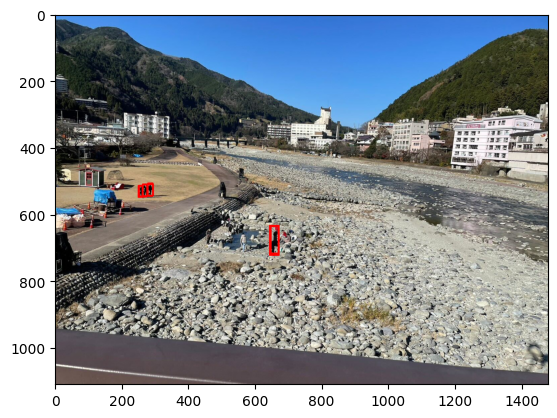

In [ ]:
#パターンマッチング 全ての画像の確認

import os
import cv2
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.patches as patches



# 画像の読み込み + グレースケール化

print(picture_name)
drive_root_dir='/content/drive/MyDrive/test_photo'
#画像の読み込み
img=cv2.imread(drive_root_dir+'/'+picture_name+'.jpg',cv2.IMREAD_COLOR)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


for i in range(35):
  for j in range(20):
    path_to_template=drive_root_dir + '/data_' + picture_name + '/found_person/' + str(i) + '_' + str(j) + '.jpg'
    is_file = os.path.isfile(path_to_template)
    if is_file:
      #print(str(i)+"_"+str(j)+"found")
      file_size = os.path.getsize(path_to_template)  # ファイルサイズを取得
      #print(file_size)
      if file_size<threshold_2:
        template = cv2.imread(path_to_template,cv2.IMREAD_COLOR)
        template_gray = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)


        # 処理対象画像に対して、テンプレート画像との類似度を算出する
        res = cv2.matchTemplate(img_gray, template_gray, cv2.TM_CCOEFF_NORMED)

        # 類似度の高い部分を検出する
        threshold = 0.8
        loc = np.where(res >= threshold)
        # テンプレートマッチング画像の高さ、幅を取得する
        h, w = template_gray.shape
        # 検出した部分に赤枠をつける
        for pt in zip(*loc[::-1]):
          cv2.rectangle(img, pt, (pt[0] + w, pt[1] + h), (0, 0, 255), 2)




# 画像の出力
show_img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
plt.imshow(show_img)
#cv2.imwrite('./tpl_match_after.png', img)

test17


True

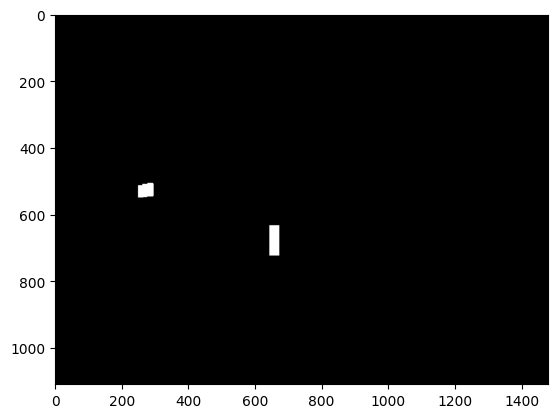

In [ ]:
#マスク作成

import os
import cv2
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.patches as patches



# 画像の読み込み + グレースケール化

print(picture_name)
drive_root_dir='/content/drive/MyDrive/test_photo'
#画像の読み込み
img=cv2.imread(drive_root_dir+'/'+picture_name+'.jpg',cv2.IMREAD_COLOR)
#mask=np.empty_like(img)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
h,w=img.shape[:2]
size=(h,w)
mask=np.zeros(size,np.uint8)


for i in range(35):
  for j in range(20):
    path_to_template=drive_root_dir + '/data_' + picture_name + '/found_person/' + str(i) + '_' + str(j) + '.jpg'
    is_file = os.path.isfile(path_to_template)
    if is_file:
      file_size = os.path.getsize(path_to_template)  # ファイルサイズを取得
      if file_size<threshold_2:
        template = cv2.imread(path_to_template,cv2.IMREAD_COLOR)
        template_gray = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)


        # 処理対象画像に対して、テンプレート画像との類似度を算出する
        res = cv2.matchTemplate(img_gray, template_gray, cv2.TM_CCOEFF_NORMED)

        # 類似度の高い部分を検出する
        threshold = 0.8
        loc = np.where(res >= threshold)
        # テンプレートマッチング画像の高さ、幅を取得する
        h, w = template_gray.shape
        # 検出した部分に赤枠をつける
        for pt in zip(*loc[::-1]):
          cv2.rectangle(mask, pt, (pt[0] + w, pt[1] + h), (255, 255, 255), -1)




# 画像の出力
show_mask = cv2.cvtColor(mask,cv2.COLOR_BGR2RGB)
plt.imshow(show_mask)
#cv2.imwrite('./tpl_match_after.png', img)
drive_root_dir='/content/drive/MyDrive/test_photo'
cv2.imwrite(drive_root_dir + '/' + picture_name + '_mask.jpg',mask)

True

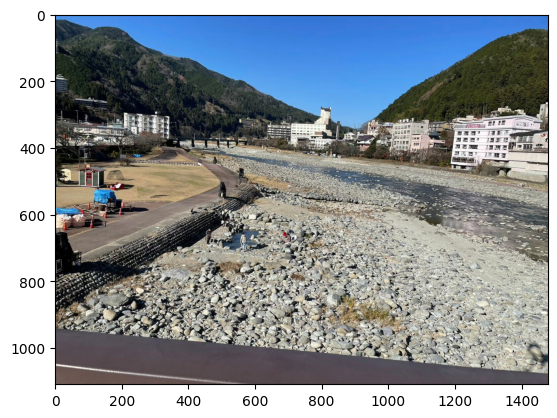

In [ ]:
#修正xphoto
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.patches as patches


drive_root_dir='/content/drive/MyDrive/test_photo'
#画像の読み込み
img=cv2.imread(drive_root_dir+'/'+picture_name+'.jpg')
mask=cv2.imread(drive_root_dir+'/'+picture_name+'_mask.jpg',0)

img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
mask_inv = cv2.bitwise_not(mask)
dst_smap = np.zeros_like(img)
cv2.xphoto.inpaint(img_lab, mask_inv, dst_smap, cv2.xphoto.INPAINT_SHIFTMAP)
dst_smap = cv2.cvtColor(dst_smap, cv2.COLOR_Lab2BGR)


show_dst = cv2.cvtColor(dst_smap,cv2.COLOR_BGR2RGB)
plt.imshow(show_dst)
cv2.imwrite(drive_root_dir + '/' + picture_name + '_xphoto.jpg',dst_smap)